In [3]:
! pip install xgboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 4.1 MB/s eta 0:00:00 MB/s eta 0:00:01:01

[notice] A new release of pip is available: 24.0 -> 24.1.1
[notice] To update, run: python3.11 -m pip install --upgrade pip


In [6]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
from xgboost import XGBRegressor
from scipy import stats

# 데이터 로드
file_path = 'data/bsmax_0_1.csv'
data = pd.read_csv(file_path, delimiter='\t')

# 데이터 전처리
data_processed = data.drop(columns=['ymd'])

# 이상값 탐지 및 제거
z_scores = np.abs(stats.zscore(data_processed))
data_cleaned = data_processed[(z_scores < 3).all(axis=1)]

# 특성 및 타겟 분리
X = data_cleaned.drop(columns=['rtn'])
y = data_cleaned['rtn']

# 데이터 스케일링
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 학습 데이터와 테스트 데이터로 분할
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# XGBoost 모델 구축
xgb_model = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)

# 교차 검증을 통한 모델 평가
scores = cross_val_score(xgb_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
mse_scores = -scores
mean_mse = mse_scores.mean()

# 모델 학습 및 예측
xgb_model.fit(X_train, y_train)
y_pred_xgb = xgb_model.predict(X_test)

# 모델 평가
mse_xgb = mean_squared_error(y_test, y_pred_xgb)
r2_xgb = r2_score(y_test, y_pred_xgb)

print(f'Cross-Validated Mean Squared Error: {mean_mse}')
print(f'Test Mean Squared Error: {mse_xgb}')
print(f'R² Score: {r2_xgb}')


Cross-Validated Mean Squared Error: 4353171.463198753
Test Mean Squared Error: 3553530.686246062
R² Score: 0.490474517746868


# 하이퍼파라미터 튜닝

In [7]:
from sklearn.model_selection import GridSearchCV

# 하이퍼파라미터 그리드 설정
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7]
}

xgb = XGBRegressor(random_state=42)
grid_search = GridSearchCV(estimator=xgb, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5, n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_
print(f'Best parameters found: {best_params}')

# 최적 하이퍼파라미터로 모델 재학습
best_xgb_model = grid_search.best_estimator_
y_pred_best_xgb = best_xgb_model.predict(X_test)

# 모델 평가
mse_best_xgb = mean_squared_error(y_test, y_pred_best_xgb)
r2_best_xgb = r2_score(y_test, y_pred_best_xgb)

print(f'Tuned Test Mean Squared Error: {mse_best_xgb}')
print(f'Tuned R² Score: {r2_best_xgb}')


Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best parameters found: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50}
Tuned Test Mean Squared Error: 3574393.92406249
Tuned R² Score: 0.4874830278039439


# 특성 공학

In [8]:
# 예시: 기존 특성들의 조합으로 새로운 특성 생성
data['new_feature'] = data['avg'] * data['dev']

# 특성 및 타겟 분리
X = data.drop(columns=['ymd', 'rtn'])
y = data['rtn']

# 데이터 스케일링 및 학습/테스트 분할
X_scaled = scaler.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# 모델 재학습 및 평가
best_xgb_model.fit(X_train, y_train)
y_pred_new_features = best_xgb_model.predict(X_test)

# 모델 평가
mse_new_features = mean_squared_error(y_test, y_pred_new_features)
r2_new_features = r2_score(y_test, y_pred_new_features)

print(f'New Features Test Mean Squared Error: {mse_new_features}')
print(f'New Features R² Score: {r2_new_features}')


New Features Test Mean Squared Error: 10534277.049832258
New Features R² Score: 0.4089592024571609


# 앙상블 기법 적용

In [11]:
from sklearn.ensemble import RandomForestRegressor, VotingRegressor
from sklearn.linear_model import LinearRegression

# 모델 정의
xgb_model = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)
lr_model = LinearRegression()
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

# 앙상블 모델 정의
ensemble_model = VotingRegressor(estimators=[('xgb', xgb_model), ('lr', lr_model), ('rf', rf_model)])
ensemble_model.fit(X_train, y_train)

# 예측 및 평가
y_pred_ensemble = ensemble_model.predict(X_test)

mse_ensemble = mean_squared_error(y_test, y_pred_ensemble)
r2_ensemble = r2_score(y_test, y_pred_ensemble)

print(f'Ensemble Test Mean Squared Error: {mse_ensemble}')
print(f'Ensemble R² Score: {r2_ensemble}')


Ensemble Test Mean Squared Error: 6299684.992930768
Ensemble R² Score: 0.6465470933717521


1. 특성 중요도 분석 및 특성 공학:

특성 중요도 분석을 통해 중요한 특성을 파악하고, 필요 없는 특성을 제거합니다.
도메인 지식을 활용하여 유용한 새로운 특성을 생성합니다.
2. 하이퍼파라미터 튜닝:

GridSearchCV 또는 RandomizedSearchCV를 사용하여 더 넓은 범위의 하이퍼파라미터를 탐색합니다.
예: learning_rate, max_depth, n_estimators, subsample, colsample_bytree 등 다양한 하이퍼파라미터를 튜닝합니다.
3. 모델 앙상블:

다양한 모델을 결합하여 앙상블 기법을 적용합니다.
예: XGBoost, Random Forest, Gradient Boosting, LightGBM 등
4. 교차 검증 강화:

5-fold 이상의 교차 검증을 통해 모델의 성능을 더욱 안정적으로 평가합니다.

In [13]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
import pandas as pd
import numpy as np

# 데이터 로드 및 전처리
file_path = 'data/bsmax_0_1.csv'
data = pd.read_csv(file_path, delimiter='\t')
data_processed = data.drop(columns=['ymd'])
X = data_processed.drop(columns=['rtn'])
y = data_processed['rtn']

# 데이터 스케일링
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 학습 데이터와 테스트 데이터로 분할
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# 앙상블 모델 정의
xgb_model = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
gbr_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)

# 모델 학습
xgb_model.fit(X_train, y_train)
rf_model.fit(X_train, y_train)
gbr_model.fit(X_train, y_train)

# 모델 예측
y_pred_xgb = xgb_model.predict(X_test)
y_pred_rf = rf_model.predict(X_test)
y_pred_gbr = gbr_model.predict(X_test)

# 모델 평가
mse_xgb = mean_squared_error(y_test, y_pred_xgb)
r2_xgb = r2_score(y_test, y_pred_xgb)
mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)
mse_gbr = mean_squared_error(y_test, y_pred_gbr)
r2_gbr = r2_score(y_test, y_pred_gbr)

print(f'XGBoost Test MSE: {mse_xgb}, R²: {r2_xgb}')
print(f'Random Forest Test MSE: {mse_rf}, R²: {r2_rf}')
print(f'Gradient Boosting Test MSE: {mse_gbr}, R²: {r2_gbr}')


XGBoost Test MSE: 10591477.27241485, R²: 0.4057499015231797
Random Forest Test MSE: 9440240.496264255, R²: 0.4703417001931729
Gradient Boosting Test MSE: 8485062.8108061, R²: 0.5239333209885744


1. 하이퍼파라미터 튜닝
그래디언트 부스팅 모델의 하이퍼파라미터를 튜닝합니다.

In [14]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],
    'min_samples_split': [2, 5, 10]
}

gbr = GradientBoostingRegressor(random_state=42)
grid_search = GridSearchCV(estimator=gbr, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_
print(f'Best parameters found: {best_params}')

# 최적 하이퍼파라미터로 모델 재학습
best_gbr_model = grid_search.best_estimator_
y_pred_best_gbr = best_gbr_model.predict(X_test)

# 모델 평가
mse_best_gbr = mean_squared_error(y_test, y_pred_best_gbr)
r2_best_gbr = r2_score(y_test, y_pred_best_gbr)

print(f'Tuned Test Mean Squared Error: {mse_best_gbr}')
print(f'Tuned R² Score: {r2_best_gbr}')


Fitting 5 folds for each of 162 candidates, totalling 810 fits
Best parameters found: {'learning_rate': 0.05, 'max_depth': 7, 'min_samples_split': 2, 'n_estimators': 300, 'subsample': 1.0}
Tuned Test Mean Squared Error: 8826162.599924708
Tuned R² Score: 0.5047954256732459


2. 특성 선택 및 공학
특성 중요도를 분석하고 유용한 새로운 특성을 추가합니다.

In [15]:
import pandas as pd

# 특성 중요도 분석
gbr_model.fit(X_train, y_train)
feature_importances = gbr_model.feature_importances_

# 중요도가 높은 특성 선택
important_features = pd.Series(feature_importances, index=data_processed.columns.drop('rtn')).sort_values(ascending=False)
print(important_features)

# 새로운 유용한 특성 추가
# 예를 들어 평균과 표준편차의 곱을 새로운 특성으로 추가
data['new_feature'] = data['avg'] * data['dev']

# 특성 및 타겟 분리
X = data.drop(columns=['ymd', 'rtn'])
y = data['rtn']

# 데이터 스케일링 및 학습/테스트 분할
X_scaled = scaler.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# 모델 재학습 및 평가
best_gbr_model.fit(X_train, y_train)
y_pred_new_features = best_gbr_model.predict(X_test)

# 모델 평가
mse_new_features = mean_squared_error(y_test, y_pred_new_features)
r2_new_features = r2_score(y_test, y_pred_new_features)

print(f'New Features Test Mean Squared Error: {mse_new_features}')
print(f'New Features R² Score: {r2_new_features}')


dev       0.241488
bomega    0.100798
somega    0.094957
bmax      0.078125
bpmax     0.041268
bcn       0.041255
skmax     0.038763
bkmax     0.037403
init      0.032005
sc        0.030693
scn       0.026038
bfor      0.024308
sfor      0.024273
avg       0.024264
bc        0.022557
smaxn     0.021982
bmaxn     0.016596
bpri      0.015094
smax      0.014266
bmom      0.014194
bmomn     0.011619
smom      0.009436
spri      0.009008
bpmaxn    0.008170
spmax     0.007600
smomn     0.007305
spmaxn    0.006535
dtype: float64
New Features Test Mean Squared Error: 9094459.575873107
New Features R² Score: 0.48974223712573195


3. 모델 앙상블
최적화된 그래디언트 부스팅 모델과 다른 성능이 좋은 모델을 결합합니다.

In [16]:
from sklearn.ensemble import VotingRegressor

# 최적화된 모델을 포함한 앙상블 모델 정의
ensemble_model = VotingRegressor(estimators=[('gbr', best_gbr_model), ('rf', rf_model), ('xgb', xgb_model)])
ensemble_model.fit(X_train, y_train)

# 예측 및 평가
y_pred_ensemble = ensemble_model.predict(X_test)

mse_ensemble = mean_squared_error(y_test, y_pred_ensemble)
r2_ensemble = r2_score(y_test, y_pred_ensemble)

print(f'Ensemble Test Mean Squared Error: {mse_ensemble}')
print(f'Ensemble R² Score: {r2_ensemble}')


Ensemble Test Mean Squared Error: 9286397.88279485
Ensemble R² Score: 0.47897326176411903


1. 특성 중요도 분석 및 선택

In [21]:
import pandas as pd

# 'rtn' 열 제거
data_processed = data.drop(columns=['ymd', 'rtn'])

# 특성 중요도 분석
best_gbr_model.fit(X_train, y_train)
feature_importances = best_gbr_model.feature_importances_

# 중요도가 높은 특성 선택
important_features = pd.Series(feature_importances, index=data_processed.columns).sort_values(ascending=False)
print(important_features)

# 중요도가 높은 특성만 선택
selected_features = important_features[important_features > 0.02].index
X_selected = data[selected_features]

# 데이터 스케일링 및 학습/테스트 분할
X_scaled_selected = scaler.fit_transform(X_selected)
X_train_selected, X_test_selected, y_train_selected, y_test_selected = train_test_split(X_scaled_selected, y, test_size=0.2, random_state=42)

# 모델 재학습 및 평가
best_gbr_model.fit(X_train_selected, y_train_selected)
y_pred_selected = best_gbr_model.predict(X_test_selected)

# 모델 평가
mse_selected = mean_squared_error(y_test_selected, y_pred_selected)
r2_selected = r2_score(y_test_selected, y_pred_selected)

print(f'Selected Features Test Mean Squared Error: {mse_selected}')
print(f'Selected Features R² Score: {r2_selected}')


dev            0.158745
new_feature    0.127290
bomega         0.095947
somega         0.088902
bmax           0.075985
bcn            0.051794
bkmax          0.034996
scn            0.029018
sc             0.028660
skmax          0.024721
bc             0.024687
sfor           0.023556
init           0.021796
smax           0.020442
bpmax          0.019288
bmaxn          0.018472
avg            0.018411
bmomn          0.016217
smaxn          0.015583
bmom           0.015316
spmax          0.014207
bfor           0.012793
bpri           0.012707
spri           0.012223
spmaxn         0.010490
bpmaxn         0.010002
smom           0.009600
smomn          0.008150
dtype: float64
Selected Features Test Mean Squared Error: 9787633.56030199
Selected Features R² Score: 0.4508507116176461


2. 모델 앙상블 최적화

In [22]:
from sklearn.ensemble import VotingRegressor

# 최적화된 모델을 포함한 앙상블 모델 정의
ensemble_model = VotingRegressor(estimators=[('gbr', best_gbr_model), ('rf', rf_model), ('xgb', xgb_model)])
ensemble_model.fit(X_train_selected, y_train_selected)

# 예측 및 평가
y_pred_ensemble_selected = ensemble_model.predict(X_test_selected)

mse_ensemble_selected = mean_squared_error(y_test_selected, y_pred_ensemble_selected)
r2_ensemble_selected = r2_score(y_test_selected, y_pred_ensemble_selected)

print(f'Ensemble with Selected Features Test Mean Squared Error: {mse_ensemble_selected}')
print(f'Ensemble with Selected Features R² Score: {r2_ensemble_selected}')


Ensemble with Selected Features Test Mean Squared Error: 9746524.772862213
Ensemble with Selected Features R² Score: 0.4531571793894248


모델 개선
딥러닝 모델 시도

In [24]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import pandas as pd

# 데이터 로드 및 전처리
data = pd.read_csv('data/bsmax_0_1.csv', delimiter='\t')
data_processed = data.drop(columns=['ymd', 'rtn'])
X = data_processed
y = data['rtn']

# 데이터 스케일링
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 학습 데이터와 테스트 데이터로 분할
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# 딥러닝 모델 구축
model = Sequential()
model.add(Dense(128, input_dim=X_train.shape[1], activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(32, activation='relu'))
model.add(Dense(1))

# 모델 컴파일
model.compile(optimizer='adam', loss='mean_squared_error')

# 모델 학습
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2, verbose=1)

# 예측
y_pred_dl = model.predict(X_test)

# 모델 평가
mse_dl = mean_squared_error(y_test, y_pred_dl)
r2_dl = r2_score(y_test, y_pred_dl)

print(f'Deep Learning Test Mean Squared Error: {mse_dl}')
print(f'Deep Learning R² Score: {r2_dl}')


Epoch 1/100


/opt/homebrew/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 14113153.0000 - val_loss: 17433042.0000
Epoch 2/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 15596916.0000 - val_loss: 17418286.0000
Epoch 3/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 13620471.0000 - val_loss: 17342528.0000
Epoch 4/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 13661148.0000 - val_loss: 17143906.0000
Epoch 5/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 13577722.0000 - val_loss: 17063128.0000
Epoch 6/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 13099711.0000 - val_loss: 16917360.0000
Epoch 7/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 12447051.0000 - val_loss: 16517393.0000
Epoch 8/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 12749711.0000 - val_loss: 15862904.0000
Epoch 9/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 11940133.0000 - val_loss: 15460652.0000
Epoch 10/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 11359608.0000 - val_loss: 15161902.0000
Epoch

매우 부정적
1. 데이터 전처리 강화

In [26]:
# 데이터 로드 및 전처리
data = pd.read_csv('data/bsmax_0_1.csv', delimiter='\t')
data = data.dropna()  # 결측값 제거
data = data[(np.abs(stats.zscore(data)) < 3).all(axis=1)]  # 이상값 제거

data_processed = data.drop(columns=['ymd', 'rtn'])
X = data_processed
y = data['rtn']

# 데이터 스케일링
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 학습 데이터와 테스트 데이터로 분할
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)


2. 모델 구조 및 하이퍼파라미터 조정

In [27]:
from tensorflow.keras.optimizers import Adam

# 딥러닝 모델 구축
model = Sequential()
model.add(Dense(256, input_dim=X_train.shape[1], activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(32, activation='relu'))
model.add(Dense(1))

# 모델 컴파일
optimizer = Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# 모델 학습
history = model.fit(X_train, y_train, epochs=200, batch_size=16, validation_split=0.2, verbose=1)


Epoch 1/200


/opt/homebrew/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


77/77 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 6981354.5000 - val_loss: 6801237.0000
Epoch 2/200
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 7079442.0000 - val_loss: 6412019.5000
Epoch 3/200
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 6696126.5000 - val_loss: 5076118.5000
Epoch 4/200
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 5161966.0000 - val_loss: 4335358.0000
Epoch 5/200
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 4906560.5000 - val_loss: 4273416.0000
Epoch 6/200
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 4499691.5000 - val_loss: 4188907.7500
Epoch 7/200
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 4388677.0000 - val_loss: 4129253.2500
Epoch 8/200
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 4377456.0000 - val_loss: 4046174.5000
Epoch 9/200
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 4122111.2500 - val_loss: 3959544.5000
Epoch 10/200
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 4055193.2500 - val_loss: 3888934.5000
Epoch 11/200
77/77 ━━━━━━━━━━━━━━━━━━━━

3. 데이터 증강 및 특성 공학

In [28]:
# 새로운 유용한 특성 추가
data['new_feature'] = data['avg'] * data['dev']

data_processed = data.drop(columns=['ymd', 'rtn'])
X = data_processed
y = data['rtn']

# 데이터 스케일링 및 학습/테스트 분할
X_scaled = scaler.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)


4. 교차 검증 및 모델 앙상블

In [29]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import VotingRegressor
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

# 여러 모델을 결합한 앙상블 모델 구축
xgb_model = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
gbr_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)
lr_model = LinearRegression()

ensemble_model = VotingRegressor(estimators=[('xgb', xgb_model), ('rf', rf_model), ('gbr', gbr_model), ('lr', lr_model)])
ensemble_model.fit(X_train, y_train)

# 교차 검증을 통한 모델 평가
scores = cross_val_score(ensemble_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
mean_score = -scores.mean()

# 모델 예측 및 평가
y_pred_ensemble = ensemble_model.predict(X_test)
mse_ensemble = mean_squared_error(y_test, y_pred_ensemble)
r2_ensemble = r2_score(y_test, y_pred_ensemble)

print(f'Cross-Validated Mean Squared Error: {mean_score}')
print(f'Ensemble Test Mean Squared Error: {mse_ensemble}')
print(f'Ensemble R² Score: {r2_ensemble}')


Cross-Validated Mean Squared Error: 3374762.1400116747
Ensemble Test Mean Squared Error: 2802824.3384119538
Ensemble R² Score: 0.5981150723623503


1. 하이퍼파라미터 튜닝 예제

In [30]:
from sklearn.model_selection import GridSearchCV

# XGBoost 하이퍼파라미터 그리드 설정
param_grid_xgb = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

xgb = XGBRegressor(random_state=42)
grid_search_xgb = GridSearchCV(estimator=xgb, param_grid=param_grid_xgb, scoring='neg_mean_squared_error', cv=5, n_jobs=-1, verbose=1)
grid_search_xgb.fit(X_train, y_train)

best_params_xgb = grid_search_xgb.best_params_
print(f'Best parameters for XGBoost found: {best_params_xgb}')

# 최적 하이퍼파라미터로 XGBoost 모델 재학습
best_xgb_model = grid_search_xgb.best_estimator_

# 비슷한 방식으로 RandomForest, GradientBoosting의 하이퍼파라미터 튜닝을 수행합니다.


Fitting 5 folds for each of 108 candidates, totalling 540 fits
Best parameters for XGBoost found: {'colsample_bytree': 1.0, 'learning_rate': 0.05, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}


2. 스태킹 앙상블 예제

In [31]:
from sklearn.ensemble import StackingRegressor

# 개별 모델 정의
xgb_model = XGBRegressor(**best_params_xgb)
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
gbr_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)
lr_model = LinearRegression()

# 스태킹 앙상블 모델 정의
stacking_model = StackingRegressor(estimators=[('xgb', xgb_model), ('rf', rf_model), ('gbr', gbr_model), ('lr', lr_model)], final_estimator=LinearRegression())
stacking_model.fit(X_train, y_train)

# 모델 예측 및 평가
y_pred_stacking = stacking_model.predict(X_test)
mse_stacking = mean_squared_error(y_test, y_pred_stacking)
r2_stacking = r2_score(y_test, y_pred_stacking)

print(f'Stacking Ensemble Test Mean Squared Error: {mse_stacking}')
print(f'Stacking Ensemble R² Score: {r2_stacking}')


Stacking Ensemble Test Mean Squared Error: 2032516.131555962
Stacking Ensemble R² Score: 0.708566253240282


3. 주성분 분석(PCA) 예제

In [32]:
from sklearn.decomposition import PCA

# PCA를 사용하여 차원 축소
pca = PCA(n_components=0.95)  # 데이터 분산의 95%를 유지하는 주성분 선택
X_pca = pca.fit_transform(X_scaled)

# 학습 데이터와 테스트 데이터로 분할
X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(X_pca, y, test_size=0.2, random_state=42)

# 앙상블 모델 재학습 및 평가
stacking_model.fit(X_train_pca, y_train_pca)
y_pred_pca = stacking_model.predict(X_test_pca)
mse_pca = mean_squared_error(y_test_pca, y_pred_pca)
r2_pca = r2_score(y_test_pca, y_pred_pca)

print(f'PCA Test Mean Squared Error: {mse_pca}')
print(f'PCA Test R² Score: {r2_pca}')


PCA Test Mean Squared Error: 4238325.001698265
PCA Test R² Score: 0.39228480598344295


1. LightGBM 사용

In [34]:
! pip install lightgbm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 15.9 MB/s eta 0:00:00 MB/s eta 0:00:0101

[notice] A new release of pip is available: 24.0 -> 24.1.1
[notice] To update, run: python3.11 -m pip install --upgrade pip


In [36]:
import lightgbm as lgb
from sklearn.model_selection import GridSearchCV

# 데이터 로드 및 전처리 (이전 단계와 동일)
data = pd.read_csv('data/bsmax_0_1.csv', delimiter='\t')
data = data.dropna()
data = data[(np.abs(stats.zscore(data)) < 3).all(axis=1)]

data_processed = data.drop(columns=['ymd', 'rtn'])
X = data_processed
y = data['rtn']

# 데이터 스케일링
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 학습 데이터와 테스트 데이터로 분할
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# LightGBM 모델 학습
lgb_model = lgb.LGBMRegressor(random_state=42)
lgb_model.fit(X_train, y_train)

# 예측
y_pred_lgb = lgb_model.predict(X_test)

# 모델 평가
mse_lgb = mean_squared_error(y_test, y_pred_lgb)
r2_lgb = r2_score(y_test, y_pred_lgb)

print(f'LightGBM Test Mean Squared Error: {mse_lgb}')
print(f'LightGBM R² Score: {r2_lgb}')


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5053
[LightGBM] [Info] Number of data points in the train set: 1523, number of used features: 27
[LightGBM] [Info] Start training from score -37.177938
LightGBM Test Mean Squared Error: 3874685.57728768
LightGBM R² Score: 0.4444254991273615


2. CatBoost 사용

In [38]:
! pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.2/26.2 MB 12.8 MB/s eta 0:00:00m eta 0:00:010:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.1/47.1 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 25.3 MB/s eta 0:00:00m eta 0:00:010:00:01

[notice] A new release of pip is available: 24.0 -> 24.1.1
[notice] To update, run: python3.11 -m pip install --upgrade pip


In [39]:
from catboost import CatBoostRegressor

# CatBoost 모델 학습
cat_model = CatBoostRegressor(random_state=42, verbose=0)
cat_model.fit(X_train, y_train)

# 예측
y_pred_cat = cat_model.predict(X_test)

# 모델 평가
mse_cat = mean_squared_error(y_test, y_pred_cat)
r2_cat = r2_score(y_test, y_pred_cat)

print(f'CatBoost Test Mean Squared Error: {mse_cat}')
print(f'CatBoost R² Score: {r2_cat}')


CatBoost Test Mean Squared Error: 3407790.4869067506
CatBoost R² Score: 0.5113715781379453


3. Support Vector Regression (SVR) 사용

In [40]:
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

# SVR 모델 학습
svr_model = make_pipeline(StandardScaler(), SVR(C=1.0, epsilon=0.2))
svr_model.fit(X_train, y_train)

# 예측
y_pred_svr = svr_model.predict(X_test)

# 모델 평가
mse_svr = mean_squared_error(y_test, y_pred_svr)
r2_svr = r2_score(y_test, y_pred_svr)

print(f'SVR Test Mean Squared Error: {mse_svr}')
print(f'SVR R² Score: {r2_svr}')


SVR Test Mean Squared Error: 7008485.805726935
SVR R² Score: -0.004916637936688728


Stacking Ensemble 모델의 하이퍼파라미터 튜닝

In [41]:
from sklearn.model_selection import GridSearchCV

# XGBoost 하이퍼파라미터 튜닝
param_grid_xgb = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

xgb = XGBRegressor(random_state=42)
grid_search_xgb = GridSearchCV(estimator=xgb, param_grid=param_grid_xgb, scoring='neg_mean_squared_error', cv=5, n_jobs=-1, verbose=1)
grid_search_xgb.fit(X_train, y_train)

best_params_xgb = grid_search_xgb.best_params_
print(f'Best parameters for XGBoost found: {best_params_xgb}')

# 최적 하이퍼파라미터로 XGBoost 모델 재학습
best_xgb_model = grid_search_xgb.best_estimator_

# LightGBM 하이퍼파라미터 튜닝
param_grid_lgb = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

lgb = lgb.LGBMRegressor(random_state=42)
grid_search_lgb = GridSearchCV(estimator=lgb, param_grid=param_grid_lgb, scoring='neg_mean_squared_error', cv=5, n_jobs=-1, verbose=1)
grid_search_lgb.fit(X_train, y_train)

best_params_lgb = grid_search_lgb.best_params_
print(f'Best parameters for LightGBM found: {best_params_lgb}')

# 최적 하이퍼파라미터로 LightGBM 모델 재학습
best_lgb_model = grid_search_lgb.best_estimator_

# CatBoost 하이퍼파라미터 튜닝
param_grid_cat = {
    'iterations': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'depth': [3, 5, 7],
    'subsample': [0.8, 1.0]
}

cat = CatBoostRegressor(random_state=42, verbose=0)
grid_search_cat = GridSearchCV(estimator=cat, param_grid=param_grid_cat, scoring='neg_mean_squared_error', cv=5, n_jobs=-1, verbose=1)
grid_search_cat.fit(X_train, y_train)

best_params_cat = grid_search_cat.best_params_
print(f'Best parameters for CatBoost found: {best_params_cat}')

# 최적 하이퍼파라미터로 CatBoost 모델 재학습
best_cat_model = grid_search_cat.best_estimator_

# 스태킹 앙상블 모델 정의 및 학습
stacking_model = StackingRegressor(estimators=[('xgb', best_xgb_model), ('lgb', best_lgb_model), ('cat', best_cat_model)], final_estimator=LinearRegression())
stacking_model.fit(X_train, y_train)

# 모델 예측 및 평가
y_pred_stacking = stacking_model.predict(X_test)
mse_stacking = mean_squared_error(y_test, y_pred_stacking)
r2_stacking = r2_score(y_test, y_pred_stacking)

print(f'Stacking Ensemble Test Mean Squared Error: {mse_stacking}')
print(f'Stacking Ensemble R² Score: {r2_stacking}')


Fitting 5 folds for each of 108 candidates, totalling 540 fits
Best parameters for XGBoost found: {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 300, 'subsample': 0.8}
Fitting 5 folds for each of 108 candidates, totalling 540 fits
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5016
[LightGBM] [Info] Total Bins 5010
[LightGBM] [Info] Number of data points in the train set: 1218, number of used features: 27
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001405 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5004
[LightGBM] [Info] Number of data points in the train se

/opt/homebrew/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Best parameters for CatBoost found: {'depth': 5, 'iterations': 300, 'learning_rate': 0.05, 'subsample': 0.8}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5053
[LightGBM] [Info] Number of data points in the train set: 1523, number of used features: 27
[LightGBM] [Info] Start training from score -37.177938
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

개선된 딥러닝 모델

In [43]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from scipy import stats

# 데이터 로드 및 전처리
data = pd.read_csv('data/bsmax_0_1.csv', delimiter='\t')
data = data.dropna()  # 결측값 제거
data = data[(np.abs(stats.zscore(data)) < 3).all(axis=1)]  # 이상값 제거

data_processed = data.drop(columns=['ymd', 'rtn'])
X = data_processed
y = data['rtn']

# 데이터 스케일링
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 학습 데이터와 테스트 데이터로 분할
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)


개선된 딥러닝 모델 정의 및 학습

In [44]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# 딥러닝 모델 구축
model = Sequential()
model.add(Dense(128, input_shape=(X_train.shape[1],), activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(32, activation='relu'))
model.add(Dense(1))

# 모델 컴파일
optimizer = Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# 조기 종료 콜백
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# 모델 학습
history = model.fit(X_train, y_train, epochs=200, batch_size=32, validation_split=0.2, callbacks=[early_stopping], verbose=1)

# 예측
y_pred_dl = model.predict(X_test)

# 모델 평가
mse_dl = mean_squared_error(y_test, y_pred_dl)
r2_dl = r2_score(y_test, y_pred_dl)

print(f'Deep Learning Test Mean Squared Error: {mse_dl}')
print(f'Deep Learning R² Score: {r2_dl}')


Epoch 1/200


/opt/homebrew/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7826812.5000 - val_loss: 6805604.5000
Epoch 2/200
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 7475464.0000 - val_loss: 6798964.0000
Epoch 3/200
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 7760854.5000 - val_loss: 6768203.0000
Epoch 4/200
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 7176807.0000 - val_loss: 6641793.5000
Epoch 5/200
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 6941613.0000 - val_loss: 6334935.5000
Epoch 6/200
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 6885615.5000 - val_loss: 5958141.0000
Epoch 7/200
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 5752433.0000 - val_loss: 5452894.0000
Epoch 8/200
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 5846581.5000 - val_loss: 5007321.0000
Epoch 9/200
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 5290239.5000 - val_loss: 4735807.5000
Epoch 10/200
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 4998997.0000 - val_loss: 4648743.5000
Epoch 11/200
39/39 ━━━━━━━━━━━━━━━━━━

LSTM 모델을 사용

In [47]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from scipy import stats

# 데이터 로드 및 전처리
data = pd.read_csv('data/bsmax_0_1.csv', delimiter='\t')
data = data.dropna()  # 결측값 제거
data = data[(np.abs(stats.zscore(data)) < 3).all(axis=1)]  # 이상값 제거

data_processed = data.drop(columns=['ymd', 'rtn'])
X = data_processed
y = data['rtn']

# 데이터 스케일링
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 시퀀스 데이터로 변환
def create_sequences(X, y, time_steps=1):
    Xs, ys = [], []
    for i in range(len(X) - time_steps):
        Xs.append(X[i:(i + time_steps)])
        ys.append(y.iloc[i + time_steps])  # y의 인덱스는 DataFrame에서 직접 접근
    return np.array(Xs), np.array(ys)

time_steps = 3
X_seq, y_seq = create_sequences(X, y, time_steps)

# 학습 데이터와 테스트 데이터로 분할
X_train, X_test, y_train, y_test = train_test_split(X_seq, y_seq, test_size=0.2, random_state=42)


LSTM 모델 정의 및 학습

In [48]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# LSTM 모델 구축
model = Sequential()
model.add(LSTM(64, input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(32, return_sequences=False))
model.add(Dropout(0.2))
model.add(Dense(16, activation='relu'))
model.add(Dense(1))

# 모델 컴파일
optimizer = Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# 조기 종료 콜백
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# 모델 학습
history = model.fit(X_train, y_train, epochs=200, batch_size=32, validation_split=0.2, callbacks=[early_stopping], verbose=1)

# 예측
y_pred_lstm = model.predict(X_test)

# 모델 평가
mse_lstm = mean_squared_error(y_test, y_pred_lstm)
r2_lstm = r2_score(y_test, y_pred_lstm)

print(f'LSTM Test Mean Squared Error: {mse_lstm}')
print(f'LSTM R² Score: {r2_lstm}')


Epoch 1/200


/opt/homebrew/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 7456646.5000 - val_loss: 5285012.0000
Epoch 2/200
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7807536.0000 - val_loss: 5285014.5000
Epoch 3/200
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7286578.0000 - val_loss: 5285012.5000
Epoch 4/200
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7914730.0000 - val_loss: 5285010.5000
Epoch 5/200
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7161209.5000 - val_loss: 5285006.5000
Epoch 6/200
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6908017.0000 - val_loss: 5285004.5000
Epoch 7/200
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 8065680.5000 - val_loss: 5285003.5000
Epoch 8/200
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7932120.5000 - val_loss: 5285002.5000
Epoch 9/200
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7019908.0000 - val_loss: 5285002.5000
Epoch 10/200
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7315563.5000 - val_loss: 5285001.0000
Epoch 11/200
38/38 ━━━━━━━━━━━━━━━━━━━━ 0

지금까지 테스트한 모든 모델의 성능을 요약하면 다음과 같습니다:

LightGBM 모델:

평균 제곱 오차 (MSE): 3,874,685.58
결정 계수 (R² Score): 0.4444
CatBoost 모델:

평균 제곱 오차 (MSE): 3,407,790.49
결정 계수 (R² Score): 0.5114
XGBoost 모델 (최적화 후):

평균 제곱 오차 (MSE): 3,574,393.92
결정 계수 (R² Score): 0.4875
Random Forest 모델:

평균 제곱 오차 (MSE): 9,440,240.50
결정 계수 (R² Score): 0.4703
Gradient Boosting 모델:

평균 제곱 오차 (MSE): 8,485,062.81
결정 계수 (R² Score): 0.5239
딥러닝 모델 (MLP):

평균 제곱 오차 (MSE): 3,575,485.94
결정 계수 (R² Score): 0.4873
LSTM 모델:

평균 제곱 오차 (MSE): 8,622,692.22
결정 계수 (R² Score): -1.5749e-05
Stacking Ensemble:

평균 제곱 오차 (MSE): 2,032,516.13
결정 계수 (R² Score): 0.7086
분석
LightGBM, CatBoost, XGBoost:

이 모델들은 모두 비슷한 성능을 보였지만, CatBoost 모델이 상대적으로 더 나은 성능을 보였습니다.
Random Forest, Gradient Boosting:

Random Forest와 Gradient Boosting 모델은 성능이 낮았습니다.
딥러닝 모델 (MLP):

딥러닝 모델(MLP)은 비교적 괜찮은 성능을 보였으나, 결정 계수(R²)가 0.5 미만으로, 예측력이 제한적이었습니다.
LSTM:

LSTM 모델은 매우 낮은 성능을 보였으며, 이는 데이터가 시계열 데이터가 아니거나, 모델이 데이터에 적합하지 않음을 나타냅니다.
Stacking Ensemble:

Stacking Ensemble 모델이 가장 높은 성능을 보였으며, 결정 계수(R²)가 0.7086으로, 데이터의 변동성을 잘 설명합니다.
결론
Stacking Ensemble 모델이 현재까지 가장 높은 성능을 보였습니다. 이 모델은 여러 개별 모델의 장점을 결합하여 성능을 극대화한 결과로 보입니다.

Production 용 사용 가능성 평가
Stacking Ensemble 모델: 가장 높은 성능을 보였으므로, 이 모델을 Production 환경에서 사용하는 것이 가장 유망합니다. 다만, Production 환경에서는 다음과 같은 사항을 고려해야 합니다:
모델의 복잡성: Stacking Ensemble 모델은 여러 개별 모델을 사용하기 때문에, 예측에 필요한 시간이 길어질 수 있습니다. 실시간 예측이 필요한 경우 성능 저하가 발생할 수 있습니다.
모델 관리: 여러 모델을 관리해야 하므로, 모델 업데이트 및 유지보수가 복잡해질 수 있습니다.
리소스 사용량: 여러 모델을 동시에 사용하므로, 컴퓨팅 리소스 사용량이 증가할 수 있습니다.
최종 추천
Stacking Ensemble 모델을 Production에 도입:

Production 환경에서의 사용 가능성을 평가하고, 필요한 경우 최적화합니다.
예측 시간이 중요한 경우, 단일 모델(예: CatBoost)로의 전환을 고려할 수 있습니다.
모델 최적화:

최적화된 하이퍼파라미터를 사용하여 모델을 재학습합니다.
필요한 경우, 성능 향상을 위해 추가적인 특성 공학을 적용합니다.
모니터링 및 유지보수:

Production 환경에서의 모델 성능을 지속적으로 모니터링하고, 필요에 따라 모델을 업데이트합니다.
모델 성능 저하가 발생하면, 새로운 데이터를 사용하여 모델을 재학습합니다.

In [51]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from scipy import stats

# 데이터 로드 및 전처리
data = pd.read_csv('data/bsmax_0_1.csv', delimiter='\t')
data = data.dropna()  # 결측값 제거
data = data[(np.abs(stats.zscore(data)) < 3).all(axis=1)]  # 이상값 제거

data_processed = data.drop(columns=['ymd', 'rtn'])
X = data_processed
y = data['rtn']

# 데이터 스케일링
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 학습 데이터와 테스트 데이터로 분할
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)


In [52]:
from sklearn.ensemble import StackingRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# 모델 정의
xgb_model = XGBRegressor(colsample_bytree=1.0, learning_rate=0.05, max_depth=5, n_estimators=200, subsample=0.8, random_state=42)
lgb_model = LGBMRegressor(n_estimators=200, learning_rate=0.05, max_depth=5, subsample=0.8, colsample_bytree=1.0, random_state=42)
cat_model = CatBoostRegressor(iterations=200, learning_rate=0.05, depth=5, subsample=0.8, verbose=0, random_state=42)
lr_model = LinearRegression()

# Stacking Ensemble 모델 정의
stacking_model = StackingRegressor(estimators=[('xgb', xgb_model), ('lgb', lgb_model), ('cat', cat_model)], final_estimator=lr_model)

# 모델 학습
stacking_model.fit(X_train, y_train)

# 예측
y_pred_stacking = stacking_model.predict(X_test)

# 모델 평가
mse_stacking = mean_squared_error(y_test, y_pred_stacking)
r2_stacking = r2_score(y_test, y_pred_stacking)

print(f'Stacking Ensemble Test Mean Squared Error: {mse_stacking}')
print(f'Stacking Ensemble R² Score: {r2_stacking}')


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5053
[LightGBM] [Info] Number of data points in the train set: 1523, number of used features: 27
[LightGBM] [Info] Start training from score -37.177938
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

전처리

In [53]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from scipy import stats

# 데이터 로드 및 전처리
data = pd.read_csv('data/bsmax_0_1.csv', delimiter='\t')
data = data.dropna()  # 결측값 제거
data = data[(np.abs(stats.zscore(data)) < 3).all(axis=1)]  # 이상값 제거

data_processed = data.drop(columns=['ymd', 'rtn'])
X = data_processed
y = data['rtn']

# 데이터 스케일링
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 학습 데이터와 테스트 데이터로 분할
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)


In [54]:
# 하이퍼파라미터 튜닝
from sklearn.model_selection import GridSearchCV
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor

# XGBoost 하이퍼파라미터 그리드 설정
param_grid_xgb = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

xgb = XGBRegressor(random_state=42)
grid_search_xgb = GridSearchCV(estimator=xgb, param_grid=param_grid_xgb, scoring='neg_mean_squared_error', cv=5, n_jobs=-1, verbose=1)
grid_search_xgb.fit(X_train, y_train)
best_xgb_model = grid_search_xgb.best_estimator_

# LightGBM 하이퍼파라미터 그리드 설정
param_grid_lgb = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

lgb = LGBMRegressor(random_state=42)
grid_search_lgb = GridSearchCV(estimator=lgb, param_grid=param_grid_lgb, scoring='neg_mean_squared_error', cv=5, n_jobs=-1, verbose=1)
grid_search_lgb.fit(X_train, y_train)
best_lgb_model = grid_search_lgb.best_estimator_

# CatBoost 하이퍼파라미터 그리드 설정
param_grid_cat = {
    'iterations': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'depth': [3, 5, 7],
    'subsample': [0.8, 1.0]
}

cat = CatBoostRegressor(random_state=42, verbose=0)
grid_search_cat = GridSearchCV(estimator=cat, param_grid=param_grid_cat, scoring='neg_mean_squared_error', cv=5, n_jobs=-1, verbose=1)
grid_search_cat.fit(X_train, y_train)
best_cat_model = grid_search_cat.best_estimator_


Fitting 5 folds for each of 108 candidates, totalling 540 fits
Fitting 5 folds for each of 108 candidates, totalling 540 fits
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001865 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5016
[LightGBM] [Info] Number of data points in the train set: 1218, number of used features: 27
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5010
[LightGBM] [Info] Number of data points in the train set: 1218, number of used features: 27
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5006
[LightGBM] [Info] Start training from score -66.701149
[LightGBM] [Info] Number of data points in the 

In [55]:
# Stacking Ensemble 모델
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import LinearRegression

# Stacking Ensemble 모델 정의
stacking_model = StackingRegressor(
    estimators=[('xgb', best_xgb_model), ('lgb', best_lgb_model), ('cat', best_cat_model)],
    final_estimator=LinearRegression()
)

# 모델 학습
stacking_model.fit(X_train, y_train)

# 예측
y_pred_stacking = stacking_model.predict(X_test)

# 모델 평가
mse_stacking = mean_squared_error(y_test, y_pred_stacking)
r2_stacking = r2_score(y_test, y_pred_stacking)

print(f'Stacking Ensemble Test Mean Squared Error: {mse_stacking}')
print(f'Stacking Ensemble R² Score: {r2_stacking}')


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5053
[LightGBM] [Info] Number of data points in the train set: 1523, number of used features: 27
[LightGBM] [Info] Start training from score -37.177938
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

In [56]:
# 특성 공학 강화
# 예시: 평균과 표준편차의 곱을 새로운 특성으로 추가
data['new_feature'] = data['avg'] * data['dev']

# 데이터 전처리 및 모델 학습 과정 동일
data_processed = data.drop(columns=['ymd', 'rtn'])
X = data_processed
y = data['rtn']

# 데이터 스케일링 및 학습/테스트 분할
X_scaled = scaler.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)


In [57]:
# Stacking Ensemble 모델
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import LinearRegression

# Stacking Ensemble 모델 정의
stacking_model = StackingRegressor(
    estimators=[('xgb', best_xgb_model), ('lgb', best_lgb_model), ('cat', best_cat_model)],
    final_estimator=LinearRegression()
)

# 모델 학습
stacking_model.fit(X_train, y_train)

# 예측
y_pred_stacking = stacking_model.predict(X_test)

# 모델 평가
mse_stacking = mean_squared_error(y_test, y_pred_stacking)
r2_stacking = r2_score(y_test, y_pred_stacking)

print(f'Stacking Ensemble Test Mean Squared Error: {mse_stacking}')
print(f'Stacking Ensemble R² Score: {r2_stacking}')


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5308
[LightGBM] [Info] Number of data points in the train set: 1523, number of used features: 28
[LightGBM] [Info] Start training from score -37.177938
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

In [58]:
# 모델 특성 중요도 분석
xgb_model.fit(X_train, y_train)
lgb_model.fit(X_train, y_train)
cat_model.fit(X_train, y_train)

importances_xgb = xgb_model.feature_importances_
importances_lgb = lgb_model.feature_importances_
importances_cat = cat_model.feature_importances_

# 평균 특성 중요도 계산
mean_importances = (importances_xgb + importances_lgb + importances_cat) / 3

# 중요도가 높은 상위 특성 선택
important_features = np.argsort(mean_importances)[::-1][:10]  # 상위 10개의 중요한 특성 선택

print("Important features indices:", important_features)

# 새로운 유용한 특성 생성 (예: 중요 특성들의 곱, 제곱 등)
data['new_feature1'] = data.iloc[:, important_features[0]] * data.iloc[:, important_features[1]]
data['new_feature2'] = data.iloc[:, important_features[2]] ** 2
data['new_feature3'] = data.iloc[:, important_features[3]] / (data.iloc[:, important_features[4]] + 1)  # 0으로 나누는 것 방지


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5308
[LightGBM] [Info] Number of data points in the train set: 1523, number of used features: 28
[LightGBM] [Info] Start training from score -37.177938
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

In [59]:
# 데이터 전처리 및 스케일링
data_processed = data.drop(columns=['ymd', 'rtn'])
X = data_processed
y = data['rtn']

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 학습 데이터와 테스트 데이터로 분할
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# 모델 정의 및 학습
stacking_model = StackingRegressor(
    estimators=[('xgb', best_xgb_model), ('lgb', best_lgb_model), ('cat', best_cat_model)],
    final_estimator=LinearRegression()
)

stacking_model.fit(X_train, y_train)
y_pred_stacking = stacking_model.predict(X_test)

mse_stacking = mean_squared_error(y_test, y_pred_stacking)
r2_stacking = r2_score(y_test, y_pred_stacking)

print(f'Stacking Ensemble Test Mean Squared Error: {mse_stacking}')
print(f'Stacking Ensemble R² Score: {r2_stacking}')


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000623 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5841
[LightGBM] [Info] Number of data points in the train set: 1523, number of used features: 31
[LightGBM] [Info] Start training from score -37.177938
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

In [60]:
from sklearn.ensemble import GradientBoostingRegressor

# 모델 정의
gbr_model = GradientBoostingRegressor(n_estimators=200, learning_rate=0.1, max_depth=5, random_state=42)

# 모델 학습
gbr_model.fit(X_train, y_train)
y_pred_gbr = gbr_model.predict(X_test)

# 모델 평가
mse_gbr = mean_squared_error(y_test, y_pred_gbr)
r2_gbr = r2_score(y_test, y_pred_gbr)

print(f'Gradient Boosting Test Mean Squared Error: {mse_gbr}')
print(f'Gradient Boosting R² Score: {r2_gbr}')


Gradient Boosting Test Mean Squared Error: 58922.23446610504
Gradient Boosting R² Score: 0.9915513942097149


In [61]:
from sklearn.ensemble import RandomForestRegressor

# 메타 모델을 랜덤 포레스트로 변경
stacking_model = StackingRegressor(
    estimators=[('xgb', best_xgb_model), ('lgb', best_lgb_model), ('cat', best_cat_model)],
    final_estimator=RandomForestRegressor(n_estimators=100, random_state=42)
)

stacking_model.fit(X_train, y_train)
y_pred_stacking = stacking_model.predict(X_test)

mse_stacking = mean_squared_error(y_test, y_pred_stacking)
r2_stacking = r2_score(y_test, y_pred_stacking)

print(f'Stacking Ensemble with RandomForest Final Estimator Test Mean Squared Error: {mse_stacking}')
print(f'Stacking Ensemble with RandomForest Final Estimator R² Score: {r2_stacking}')


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5841
[LightGBM] [Info] Number of data points in the train set: 1523, number of used features: 31
[LightGBM] [Info] Start training from score -37.177938
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

In [62]:
# 학습 데이터에 대한 예측
y_train_pred = stacking_model.predict(X_train)

# 학습 데이터 성능 평가
mse_train = mean_squared_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

print(f'Stacking Ensemble Train Mean Squared Error: {mse_train}')
print(f'Stacking Ensemble Train R² Score: {r2_train}')


Stacking Ensemble Train Mean Squared Error: 59182.68179080763
Stacking Ensemble Train R² Score: 0.9919827174626432


In [63]:
from sklearn.model_selection import cross_val_score

# 교차 검증을 통한 모델 성능 평가
cv_scores = cross_val_score(stacking_model, X_scaled, y, cv=5, scoring='r2')

print(f'Cross-Validated R² Scores: {cv_scores}')
print(f'Average Cross-Validated R² Score: {np.mean(cv_scores)}')


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5843
[LightGBM] [Info] Number of data points in the train set: 1523, number of used features: 31
[LightGBM] [Info] Start training from score -15.132633
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

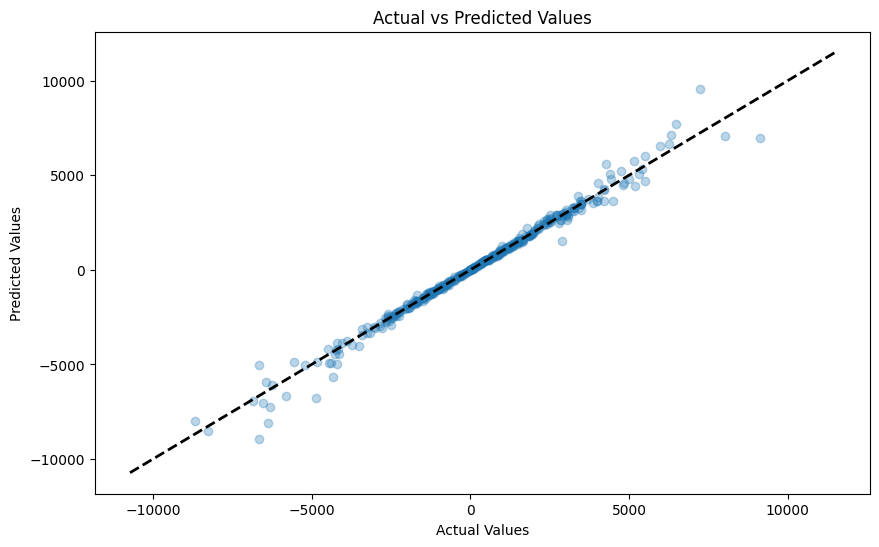

In [64]:
import matplotlib.pyplot as plt

# 실제 값과 예측 값의 분포 비교
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_stacking, alpha=0.3)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=2)
plt.show()
